In [1]:
import matplotlib.pyplot as plt
import numpy as np

from src.structured_random_features.src.models.weights import V1_weights

# Packages for fft and fitting data
# from scipy import fftpack as fft
# from sklearn.linear_model import Lasso

# Package for importing image representation
from PIL import Image, ImageOps

# My code
from src.V1_Compress import generate_Y, compress
from src.filter_reconst import filter_reconstruction

import seaborn as sns
import time
import os.path

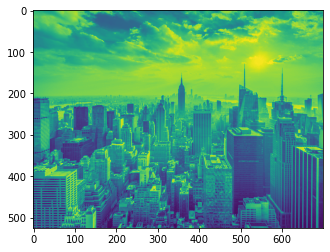

In [2]:
image_nm = 'city.png'
img = Image.open('image/' + image_nm)
img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
orig_dim = img_arr.shape

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


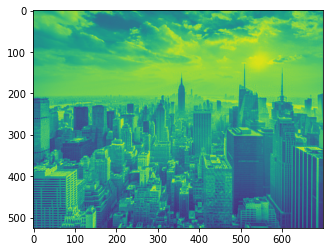

In [3]:
plt.imshow(filter_reconstruction(200, img_arr, 7, 2))

In [4]:
low_cell_res = filter_reconstruction(50, img_arr, 7, 2)
mid_cell_res = filter_reconstruction(200, img_arr, 7, 2)
high_cell_res = filter_reconstruction(500, img_arr, 7, 2)

(540, 720)


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 350552.3616385273, tolerance: 329627.3970779284
  model = cd_fast.enet_coordinate_descent(


iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114151.72195398362, tolerance: 102415.85331064035
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188831.91596704215, tolerance: 83336.24565942201
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136502.99337939732, tolerance: 99505.34311154336
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_desce

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160110.41323148934, tolerance: 108944.52355254308
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


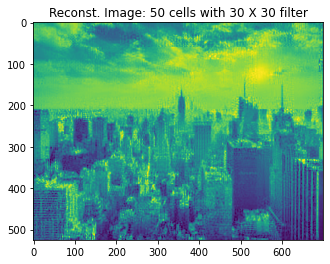

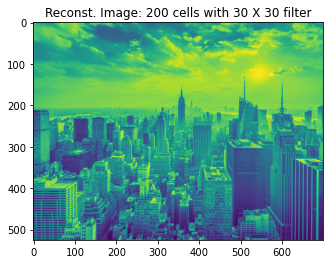

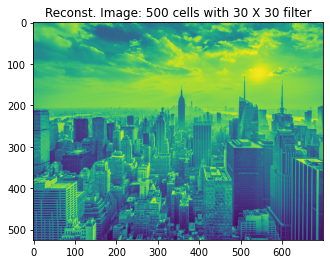

In [5]:
plt.imshow(low_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 50 cells with 30 X 30 filter')
plt.show()

plt.imshow(mid_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 200 cells with 30 X 30 filter')
plt.show()

plt.imshow(high_cell_res, vmin = 0, vmax = 256)
plt.title('Reconst. Image: 500 cells with 30 X 30 filter')
plt.show()

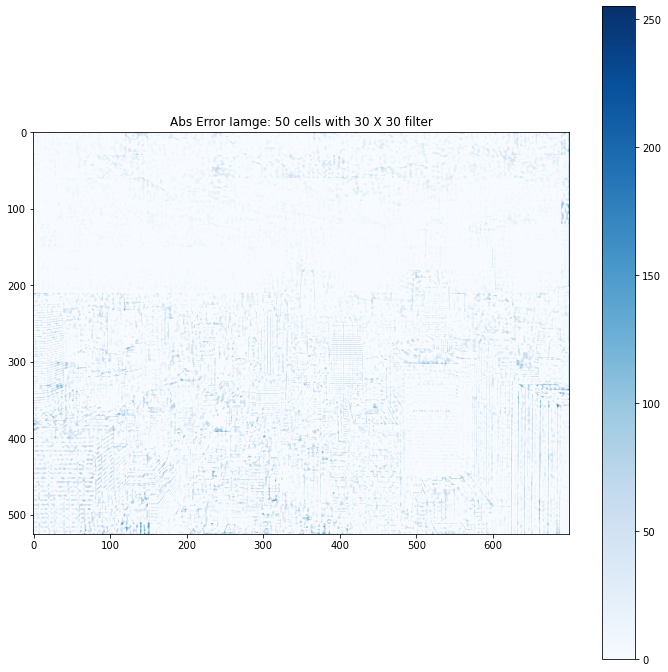

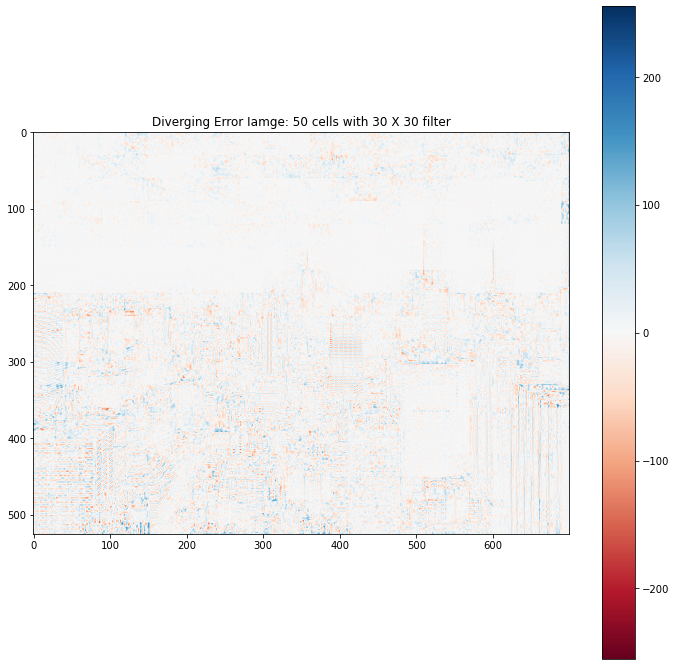

In [31]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - low_cell_res, vmin=0, vmax=255, cmap = 'Blues')
plt.colorbar(ax)
plt.title('Abs Error Iamge: 50 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - low_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.title('Diverging Error Iamge: 50 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

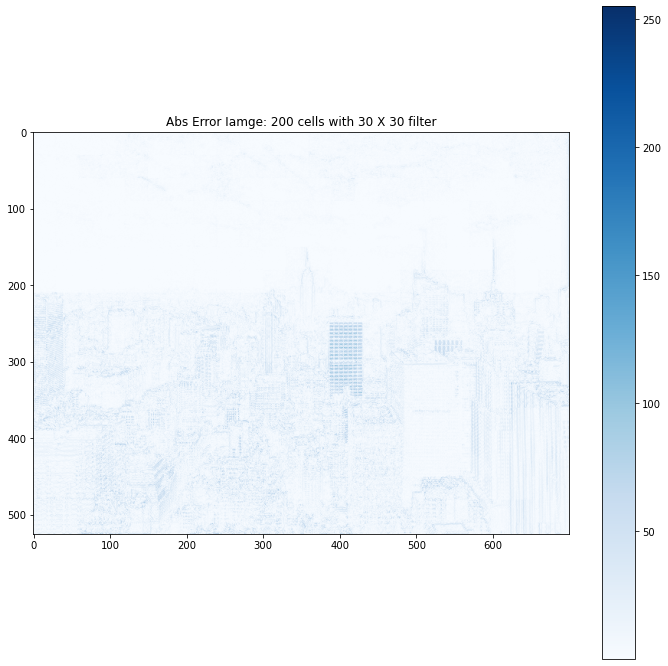

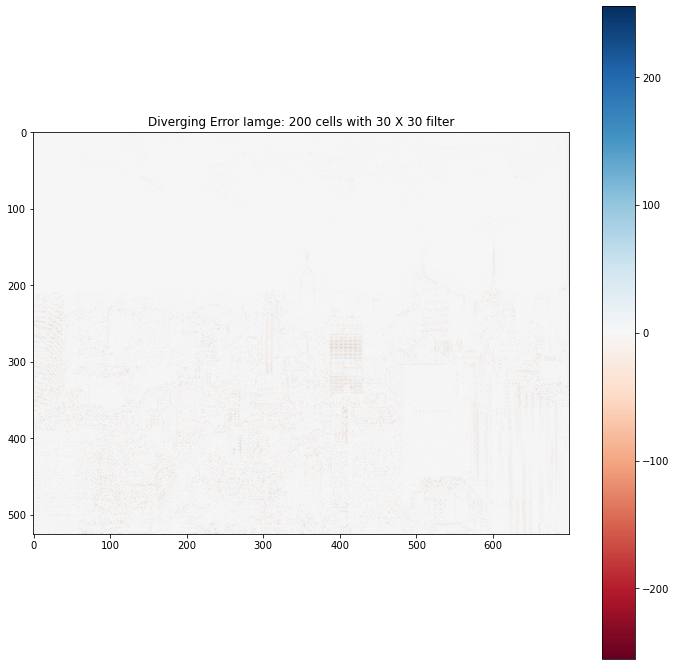

In [30]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(np.abs(img_arr - mid_cell_res), vmax=255, cmap = 'Blues')
plt.title('Abs Error Iamge: 200 cells with 30 X 30 filter')
plt.colorbar(ax)
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - mid_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.title('Diverging Error Iamge: 200 cells with 30 X 30 filter')
np.linalg.norm(img - mid_cell_res, 'fro') / np.sqrt(m*n)

plt.show()

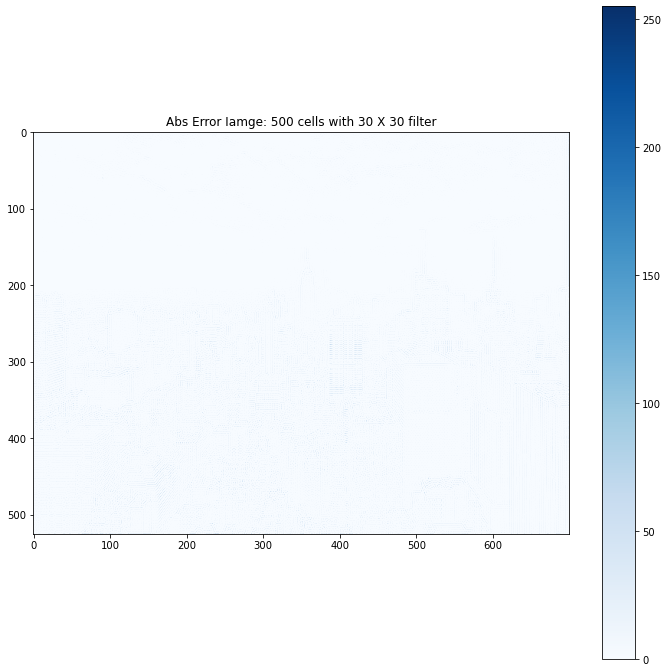

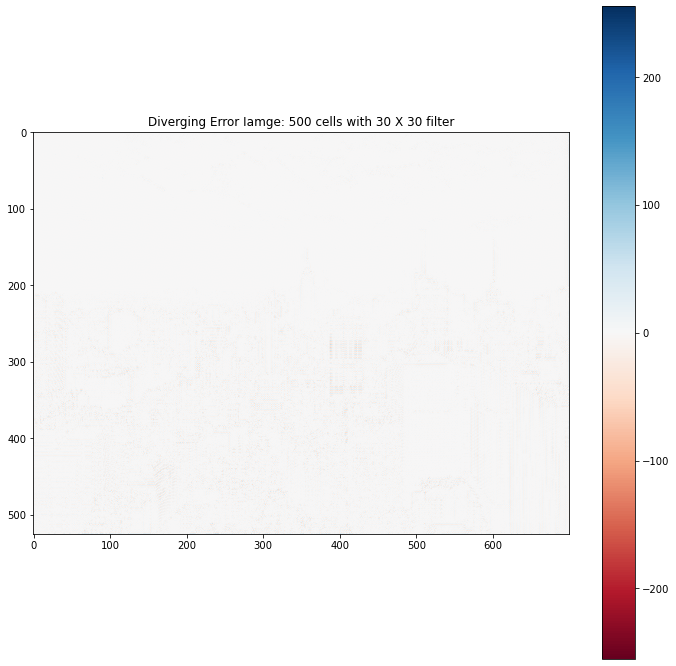

In [34]:
n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - high_cell_res, vmin=0, vmax=255, cmap = 'Blues')
plt.colorbar(ax)
plt.title('Abs Error Iamge: 500 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()


n,m = img_arr.shape
plt.figure(figsize=(12, 12))
ax = plt.imshow(img_arr - high_cell_res, vmin=-255, vmax=255, cmap='RdBu')
plt.colorbar(ax)
plt.title('Diverging Error Iamge: 500 cells with 30 X 30 filter')
np.linalg.norm(img - high_cell_res, 'fro') / np.sqrt(m*n)
plt.show()

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


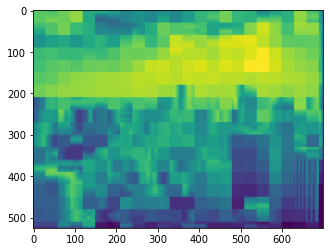

In [22]:
temp = filter_reconstruction(num_cell =200, img_arr = img_arr, sparse_freq = 2, cell_size = 7, alpha = 5000)

plt.imshow(temp)

(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3073.377599693248, tolerance: 3071.3779800436614
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330415.71589025296, tolerance: 120155.75857072187
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102534.07886370583, tolerance: 59609.59176671512
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 689600.1626756449, tolerance: 571934.5862513459
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descen

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111558.71702999671, tolerance: 70121.52281102093
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221461.41301805663, tolerance: 169642.56131101996
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 535842.024545819, tolerance: 496236.3592800453
  model = cd_fast.enet_coordinate_descent(


iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102110.5906074536, tolerance: 56624.28967835806
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 292743.1100325913, tolerance: 256126.68081145984
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 236913.66031296883, tolerance: 132294.12233680935
  model = cd_fast.enet_coordinate_descent(
/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descen

iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2625.5434905613265, tolerance: 509.4405678646689
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162679.20453317667, tolerance: 141053.70981980316
  model = cd_fast.enet_coordinate_descent(


iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83447.47966571043, tolerance: 82024.00915916615
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169876.10865408386, tolerance: 143804.17215172853
  model = cd_fast.enet_coordinate_descent(


iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430


/home/bans/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99082.01961936393, tolerance: 71738.59448715035
  model = cd_fast.enet_coordinate_descent(


(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
iteration 258
iteration 344
iteration 430
(540, 720)
iteration 86
iteration 172
it

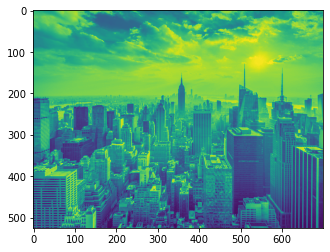

In [10]:
#import image information
image_nm = 'city.png'
img = Image.open('image/' + image_nm)
img = ImageOps.grayscale(img)
img_arr = np.asarray(img)
plt.imshow(img)
dim = img_arr.shape

# res1 for fixed alpha value and res2 for storing alpha value depending on number of cell
res1 = []
res2 = []
param_list = []
num_cell = 100
sparse_freq = 2
cell_size = 7
num_cell_list = [50, 100, 300, 500]

for num_cell in num_cell_list:
    for alpha in [0.0002, 0.002, 0.02, 0.2, 2, 20] :
        param_list.append((num_cell, alpha))
        res1.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                          sparse_freq = sparse_freq, cell_size = cell_size, alpha = alpha))
    res2.append(filter_reconstruction(num_cell = num_cell, img_arr = img_arr, 
                                      sparse_freq = sparse_freq, cell_size = cell_size))

In [11]:
# path to save image array into image
save_path = os.path.join('./result/auto_alpha_comparison/')

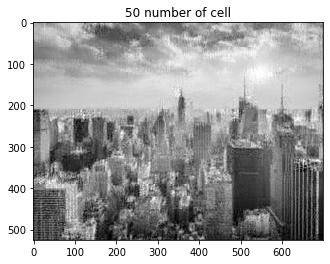

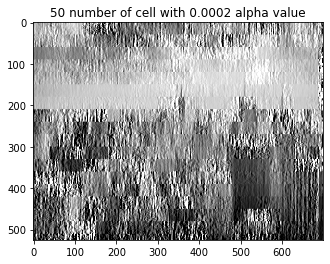

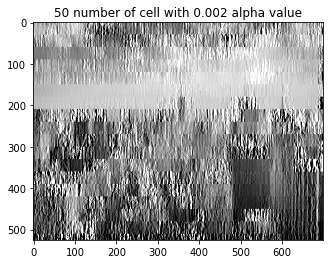

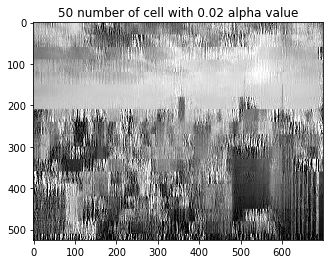

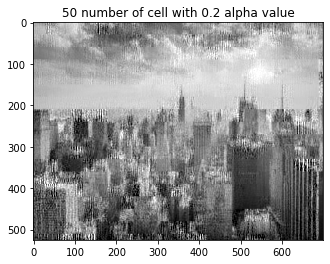

...

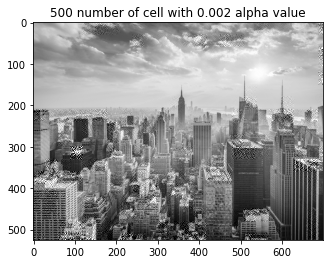

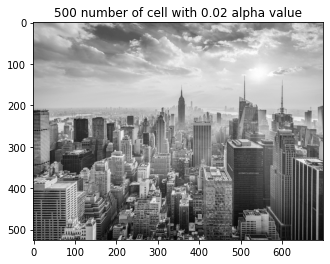

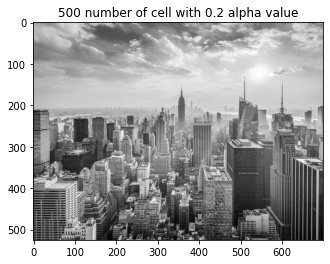

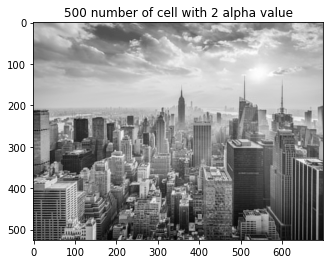

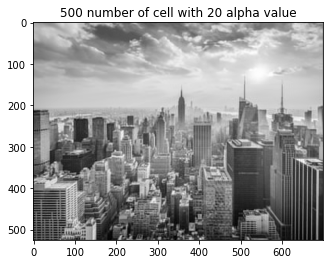

In [12]:
cell = 0

for i, r2 in enumerate(res1):
    if (param_list[i][0] != cell):
        r1 = res2[i % len(res2)]
        cell = param_list[i][0]
        title1 = "{num_cell} number of cell".format(num_cell = cell)
        np.save(save_path + (title1.replace(" ", "_")) + ".npy", r1)
        plt.imshow(r1, cmap = 'gray', vmin=0, vmax=255)
        plt.title(title1)
        plt.savefig(save_path + (title1.replace(" ", "_")) + "_scaled.png", dpi=200)
        plt.show()
        
#         im1 = Image.fromarray(r1)
#         im1.save(save_path + (title1.replace(" ", "_")) + "_color_scaled.png")
        
    title2 = "{num_cell} number of cell with {alpha} alpha value".format(
        num_cell = param_list[i][0], alpha = param_list[i][1])
    np.save(save_path + (title2.replace(" ", "_")) + ".npy", r2)
    plt.imshow(r2, cmap = 'gray', vmin=0, vmax=255)
    plt.title(title2) 
    plt.savefig(save_path + (title2.replace(" ", "_")) + "_scaled.png", dpi=200)
    plt.show()
    
#     im2 = Image.fromarray(r2)
#     im2.save(save_path + title2.replace(" ", "_") + "_color_scaled.png" )


In [44]:
save_path = os.path.join('./result/auto_alpha_comparison/')


'./result/auto_alpha_comparison/50_number_of_cell.png'

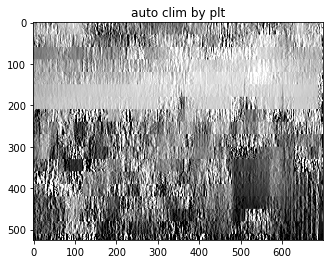

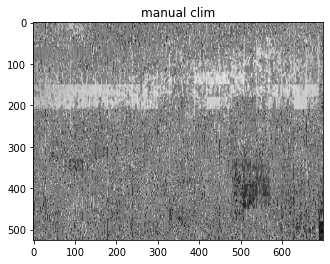

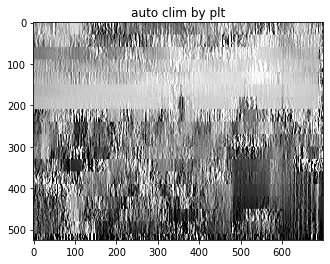

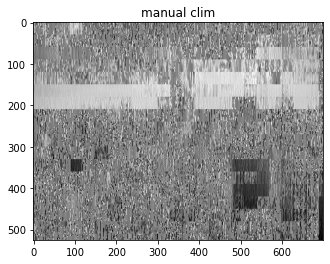

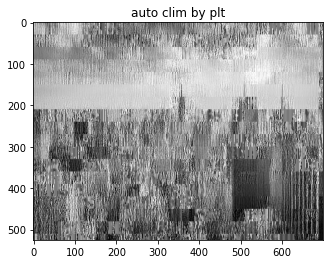

...

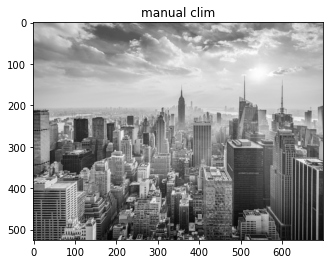

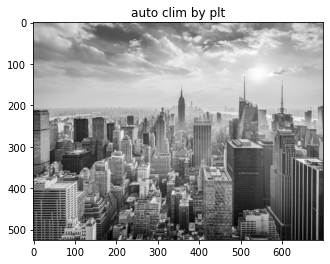

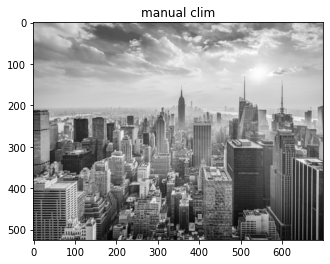

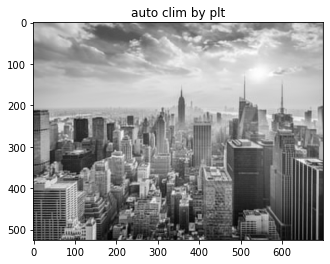

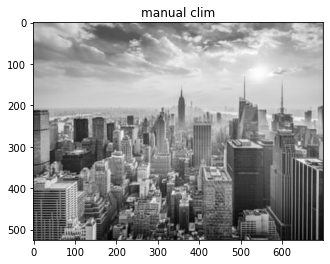

In [76]:
for i in range(len(res1)):
    plt.imshow(res1[i], vmin = 0, vmax = 255, cmap = 'gray')
    plt.title("auto clim by plt")
    plt.show()

    t = res1[i]
    t[t > 255] = 255
    t[t < 0] = 0

    plt.imshow(t, cmap = "gray")
    plt.title("manual clim")
    plt.show()

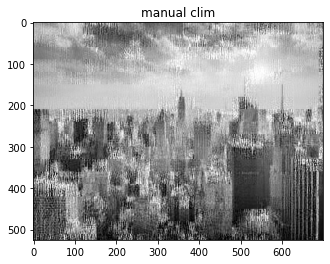

In [88]:
t = res1[3]
t[t > 255] = 255
t[t < 0] = 0

plt.imshow(t, cmap = "gray")
plt.title("manual clim")
plt.show()

In [87]:
n = [[1, 2, 3], [4, 5, 6], [7, 8, 9, 10]]
np.asarray(n)

array([list([1, 2, 3]), list([4, 5, 6]), list([7, 8, 9, 10])],
      dtype=object)